In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Rectangle
from IPython.display import HTML, display
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

np.random.seed(42)
tf.random.set_seed(42)

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.labelsize"] = 12
plt.rcParams["font.size"] = 11

In [2]:
(X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()

print("Training images :", X_train.shape)
print("Training labels :", y_train.shape)
print("Testing images  :", X_test.shape)
print("Testing labels  :", y_test.shape)
print("Pixel range     :", X_train.min(), "to", X_train.max())

Training images : (60000, 28, 28)
Training labels : (60000,)
Testing images  : (10000, 28, 28)
Testing labels  : (10000,)
Pixel range     : 0 to 255


In [3]:
X_train_norm = X_train.astype("float32") / 255.0
X_test_norm = X_test.astype("float32") / 255.0

print("Original dtype :", X_train.dtype)
print("Normalized dtype:", X_train_norm.dtype)
print("Normalized range:", X_train_norm.min(), "to", X_train_norm.max())

Original dtype : uint8
Normalized dtype: float32
Normalized range: 0.0 to 1.0


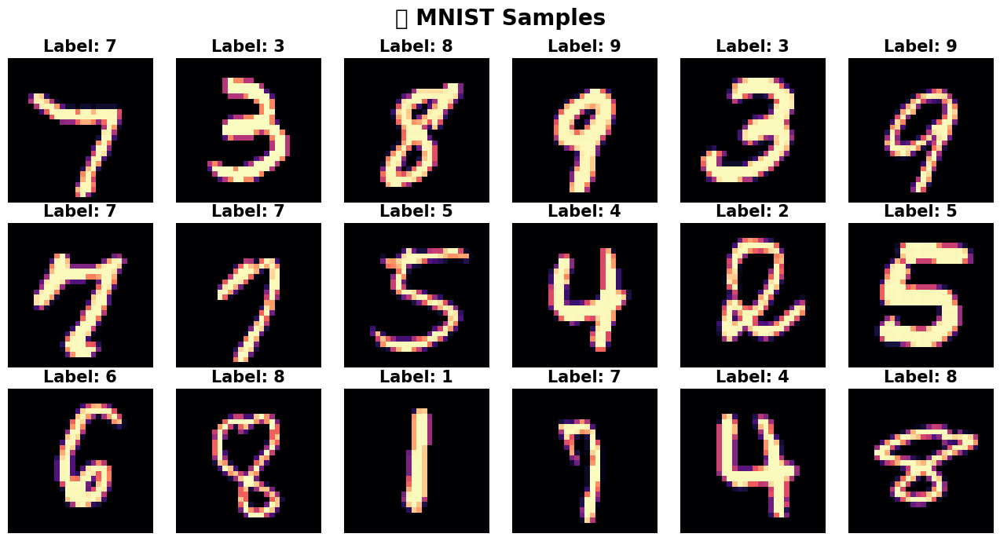

In [4]:
fig, axes = plt.subplots(3, 6, figsize=(13, 7))

indices = np.random.choice(len(X_train), 18, replace=False)

for ax, idx in zip(axes.ravel(), indices):
    ax.imshow(X_train_norm[idx], cmap="magma")
    ax.set_title(f"Label: {y_train[idx]}", fontweight="bold")
    ax.axis("off")

fig.suptitle("🔢 MNIST Samples", fontsize=20, fontweight="bold")
plt.tight_layout()
plt.show()

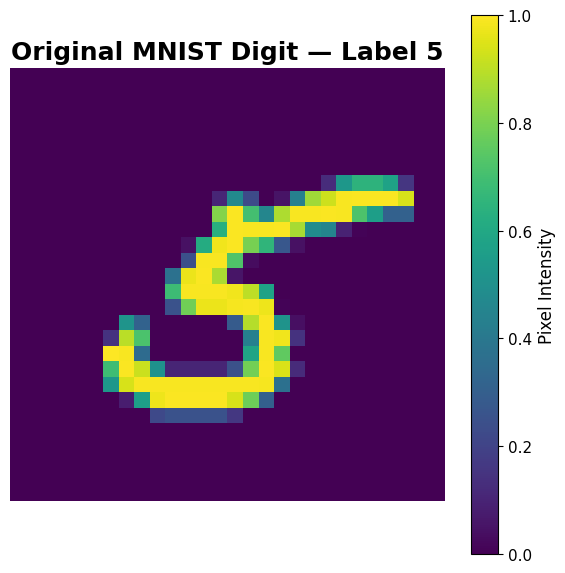

In [5]:
digit_index = np.where(y_train == 5)[0][10]

digit = X_train_norm[digit_index]

plt.figure(figsize=(7, 7))
plt.imshow(digit, cmap="viridis")
plt.title(f"Original MNIST Digit — Label {y_train[digit_index]}", fontsize=18, fontweight="bold")
plt.colorbar(label="Pixel Intensity")
plt.axis("off")
plt.show()

In [6]:
np.set_printoptions(precision=2, suppress=True)

print("Image shape:", digit.shape)
print("\nTop-left 8 × 8 region:\n")
print(digit[:8, :8])

Image shape: (28, 28)

Top-left 8 × 8 region:

[[0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]]


In [7]:
def max_pool_manual(image, pool_size=2, stride=2):
    h, w = image.shape

    output_h = (h - pool_size) // stride + 1
    output_w = (w - pool_size) // stride + 1

    pooled = np.zeros((output_h, output_w))

    for i in range(output_h):
        for j in range(output_w):
            r_start = i * stride
            r_end = r_start + pool_size

            c_start = j * stride
            c_end = c_start + pool_size

            window = image[r_start:r_end, c_start:c_end]
            pooled[i, j] = np.max(window)

    return pooled

In [8]:
def average_pool_manual(image, pool_size=2, stride=2):
    h, w = image.shape

    output_h = (h - pool_size) // stride + 1
    output_w = (w - pool_size) // stride + 1

    pooled = np.zeros((output_h, output_w))

    for i in range(output_h):
        for j in range(output_w):
            r_start = i * stride
            r_end = r_start + pool_size

            c_start = j * stride
            c_end = c_start + pool_size

            window = image[r_start:r_end, c_start:c_end]
            pooled[i, j] = np.mean(window)

    return pooled

In [9]:
def min_pool_manual(image, pool_size=2, stride=2):
    h, w = image.shape

    output_h = (h - pool_size) // stride + 1
    output_w = (w - pool_size) // stride + 1

    pooled = np.zeros((output_h, output_w))

    for i in range(output_h):
        for j in range(output_w):
            r_start = i * stride
            r_end = r_start + pool_size

            c_start = j * stride
            c_end = c_start + pool_size

            window = image[r_start:r_end, c_start:c_end]
            pooled[i, j] = np.min(window)

    return pooled

In [10]:
max_pooled = max_pool_manual(digit, pool_size=2, stride=2)
avg_pooled = average_pool_manual(digit, pool_size=2, stride=2)
min_pooled = min_pool_manual(digit, pool_size=2, stride=2)

print("Original shape :", digit.shape)
print("Max pool shape :", max_pooled.shape)
print("Avg pool shape :", avg_pooled.shape)
print("Min pool shape :", min_pooled.shape)

Original shape : (28, 28)
Max pool shape : (14, 14)
Avg pool shape : (14, 14)
Min pool shape : (14, 14)


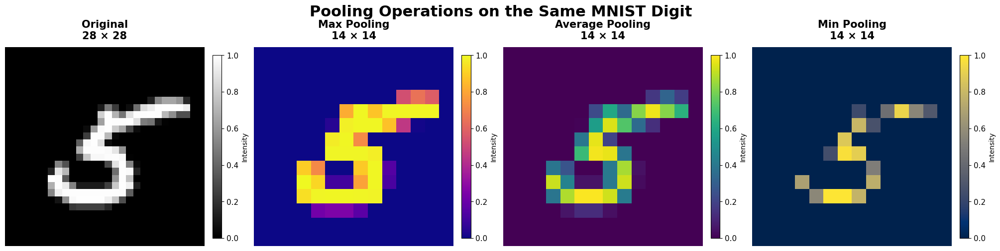

In [11]:
import matplotlib.pyplot as plt

images = [
    digit,
    max_pooled,
    avg_pooled,
    min_pooled
]

titles = [
    "Original\n28 × 28",
    "Max Pooling\n14 × 14",
    "Average Pooling\n14 × 14",
    "Min Pooling\n14 × 14"
]

cmaps = [
    "gray",
    "plasma",
    "viridis",
    "cividis"
]

fig, axes = plt.subplots(
    1, 4,
    figsize=(20, 5.5),
    constrained_layout=True
)

for ax, img, title, cmap in zip(axes, images, titles, cmaps):

    im = ax.imshow(
        img,
        cmap=cmap,
        vmin=0,
        vmax=1,
        interpolation="nearest"
    )

    ax.set_title(
        title,
        fontsize=15,
        fontweight="bold",
        pad=12
    )

    ax.axis("off")

    cbar = fig.colorbar(
        im,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )

    cbar.set_label(
        "Intensity",
        fontsize=10
    )

fig.suptitle(
    "Pooling Operations on the Same MNIST Digit",
    fontsize=22,
    fontweight="bold",
    y=1.02
)

plt.show()

In [12]:
window = digit[8:10, 8:10]

print("2 × 2 window:\n")
print(window)

print("\nMaximum :", np.max(window))
print("Average :", np.mean(window))
print("Minimum :", np.min(window))

2 × 2 window:

[[0. 0.]
 [0. 0.]]

Maximum : 0.0
Average : 0.0
Minimum : 0.0


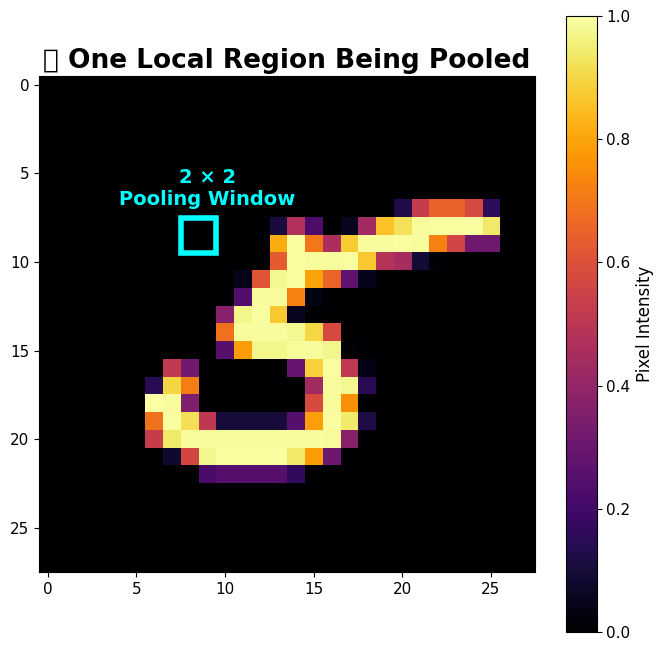

In [13]:
fig, ax = plt.subplots(figsize=(8, 8))

im = ax.imshow(digit, cmap="inferno")

rectangle = Rectangle(
    (8 - 0.5, 8 - 0.5),
    2,
    2,
    linewidth=4,
    edgecolor="cyan",
    facecolor="none"
)

ax.add_patch(rectangle)

ax.text(
    9,
    7,
    "2 × 2\nPooling Window",
    ha="center",
    va="bottom",
    fontsize=14,
    fontweight="bold",
    color="cyan"
)

ax.set_title("🔍 One Local Region Being Pooled", fontsize=19, fontweight="bold")
plt.colorbar(im, ax=ax, label="Pixel Intensity")
plt.show()

In [14]:
print("Selected 2 × 2 region:\n")
print(window)

print("\nMAX POOLING")
print("max(", window.flatten(), ") =", np.max(window))

print("\nAVERAGE POOLING")
print("mean(", window.flatten(), ") =", np.mean(window))

print("\nMIN POOLING")
print("min(", window.flatten(), ") =", np.min(window))

Selected 2 × 2 region:

[[0. 0.]
 [0. 0.]]

MAX POOLING
max( [0. 0. 0. 0.] ) = 0.0

AVERAGE POOLING
mean( [0. 0. 0. 0.] ) = 0.0

MIN POOLING
min( [0. 0. 0. 0.] ) = 0.0


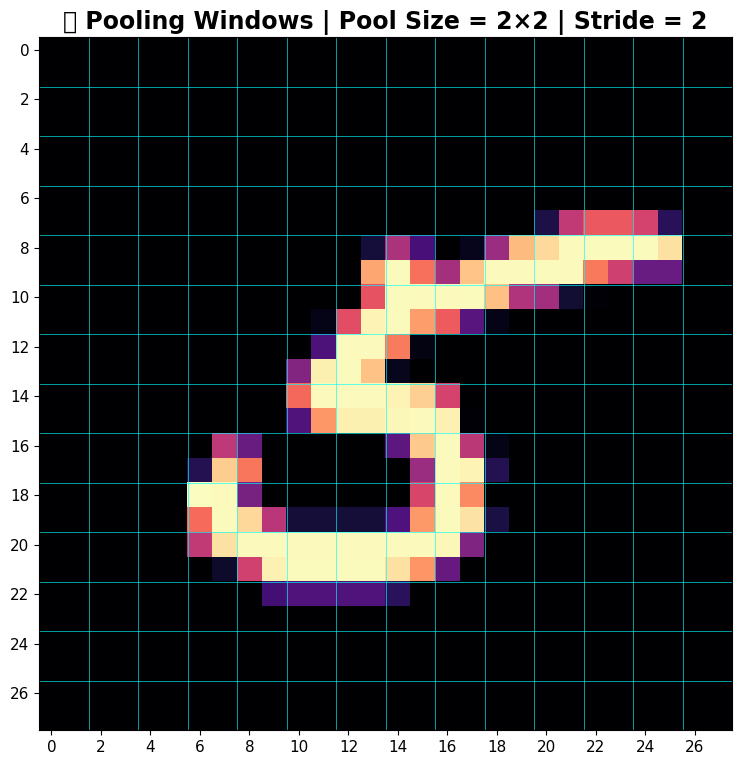

In [15]:
def visualize_pooling_grid(image, pool_size=2, stride=2):
    fig, ax = plt.subplots(figsize=(9, 9))

    ax.imshow(image, cmap="magma")

    h, w = image.shape

    output_h = (h - pool_size) // stride + 1
    output_w = (w - pool_size) // stride + 1

    for i in range(output_h):
        for j in range(output_w):
            x = j * stride - 0.5
            y = i * stride - 0.5

            rect = Rectangle(
                (x, y),
                pool_size,
                pool_size,
                fill=False,
                linewidth=0.6,
                edgecolor="cyan",
                alpha=0.45
            )

            ax.add_patch(rect)

    ax.set_title(
        f"🧩 Pooling Windows | Pool Size = {pool_size}×{pool_size} | Stride = {stride}",
        fontsize=17,
        fontweight="bold"
    )

    ax.set_xticks(np.arange(0, w, 2))
    ax.set_yticks(np.arange(0, h, 2))

    plt.show()


visualize_pooling_grid(digit, pool_size=2, stride=2)

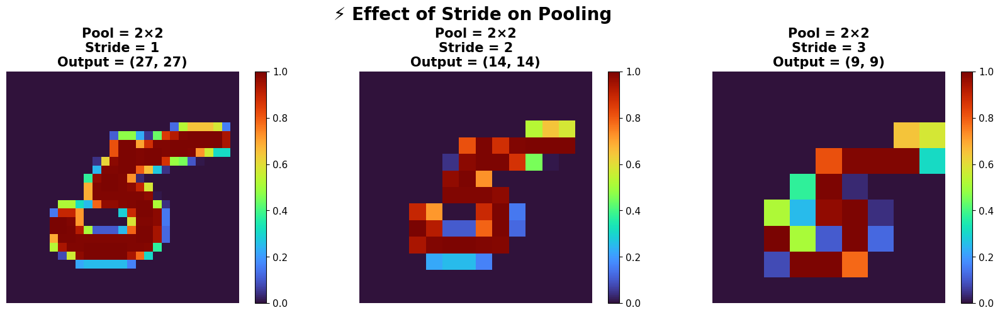

In [16]:
pool_results = {}

for stride in [1, 2, 3]:
    result = max_pool_manual(digit, pool_size=2, stride=stride)
    pool_results[stride] = result

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

for ax, stride in zip(axes, [1, 2, 3]):
    im = ax.imshow(pool_results[stride], cmap="turbo")

    ax.set_title(
        f"Pool = 2×2\nStride = {stride}\nOutput = {pool_results[stride].shape}",
        fontweight="bold"
    )

    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046)

fig.suptitle("⚡ Effect of Stride on Pooling", fontsize=20, fontweight="bold")
plt.tight_layout()
plt.show()

In [17]:
def pooling_output_size(input_size, pool_size, stride, padding="valid"):
    if padding == "valid":
        return (input_size - pool_size) // stride + 1

    elif padding == "same":
        return int(np.ceil(input_size / stride))

    else:
        raise ValueError("padding must be 'valid' or 'same'")


input_size = 28
pool_size = 2
stride = 2

output_size = pooling_output_size(
    input_size,
    pool_size,
    stride,
    padding="valid"
)

print("Input size :", input_size)
print("Pool size  :", pool_size)
print("Stride     :", stride)
print("Padding    : valid")
print("Output size:", output_size)

print("\nFormula:")
print("(28 - 2) / 2 + 1 = 14")

Input size : 28
Pool size  : 2
Stride     : 2
Padding    : valid
Output size: 14

Formula:
(28 - 2) / 2 + 1 = 14


In [18]:
def create_pooling_animation(image, pool_size=2, stride=2):
    fig, ax = plt.subplots(figsize=(8, 8))

    output_h = (image.shape[0] - pool_size) // stride + 1
    output_w = (image.shape[1] - pool_size) // stride + 1

    def update(frame):
        ax.clear()
        ax.imshow(image, cmap="magma")

        row = frame // output_w
        col = frame % output_w

        r_start = row * stride
        c_start = col * stride

        window = image[
            r_start:r_start + pool_size,
            c_start:c_start + pool_size
        ]

        pooled_value = np.max(window)

        rect = Rectangle(
            (c_start - 0.5, r_start - 0.5),
            pool_size,
            pool_size,
            linewidth=4,
            edgecolor="cyan",
            facecolor="none"
        )

        ax.add_patch(rect)

        ax.text(
            c_start + pool_size / 2 - 0.5,
            r_start - 1,
            f"MAX = {pooled_value:.2f}",
            color="cyan",
            fontsize=12,
            fontweight="bold",
            ha="center"
        )

        ax.set_title(
            f"Max Pooling Step {frame + 1}/{output_h * output_w}\n"
            f"Window Position = ({r_start}, {c_start})",
            fontsize=16,
            fontweight="bold"
        )

        ax.set_xticks(range(0, image.shape[1], 2))
        ax.set_yticks(range(0, image.shape[0], 2))

        return ax

    ani = animation.FuncAnimation(
        fig,
        update,
        frames=output_h * output_w,
        interval=70,
        repeat=False
    )

    plt.close(fig)

    return ani


ani = create_pooling_animation(digit, pool_size=2, stride=2)

HTML(ani.to_jshtml())

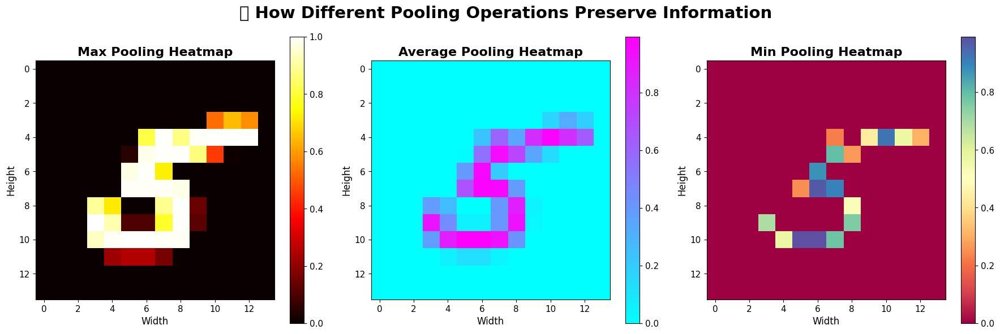

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns_data = [
    max_pooled,
    avg_pooled,
    min_pooled
]

titles = [
    "Max Pooling Heatmap",
    "Average Pooling Heatmap",
    "Min Pooling Heatmap"
]

cmaps = [
    "hot",
    "cool",
    "Spectral"
]

for ax, data, title, cmap in zip(axes, sns_data, titles, cmaps):
    im = ax.imshow(data, cmap=cmap)
    ax.set_title(title, fontsize=16, fontweight="bold")
    ax.set_xlabel("Width")
    ax.set_ylabel("Height")
    plt.colorbar(im, ax=ax)

fig.suptitle("🔥 How Different Pooling Operations Preserve Information",
             fontsize=21, fontweight="bold")

plt.tight_layout()
plt.show()

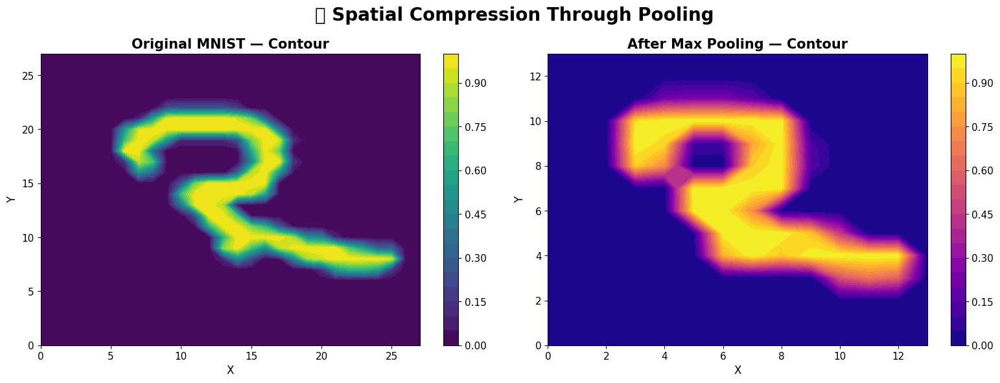

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

x1 = np.arange(digit.shape[1])
y1 = np.arange(digit.shape[0])

x2 = np.arange(max_pooled.shape[1])
y2 = np.arange(max_pooled.shape[0])

X1, Y1 = np.meshgrid(x1, y1)
X2, Y2 = np.meshgrid(x2, y2)

c1 = axes[0].contourf(X1, Y1, digit, levels=20, cmap="viridis")
axes[0].set_title("Original MNIST — Contour", fontweight="bold")
axes[0].set_xlabel("X")
axes[0].set_ylabel("Y")

c2 = axes[1].contourf(X2, Y2, max_pooled, levels=20, cmap="plasma")
axes[1].set_title("After Max Pooling — Contour", fontweight="bold")
axes[1].set_xlabel("X")
axes[1].set_ylabel("Y")

fig.colorbar(c1, ax=axes[0])
fig.colorbar(c2, ax=axes[1])

fig.suptitle("📉 Spatial Compression Through Pooling",
             fontsize=20, fontweight="bold")

plt.tight_layout()
plt.show()

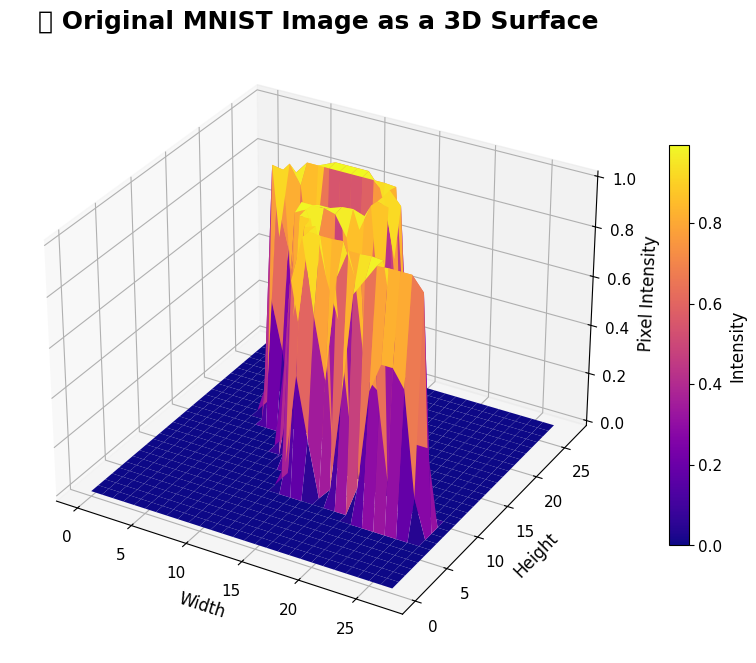

In [21]:
fig = plt.figure(figsize=(11, 8))
ax = fig.add_subplot(111, projection="3d")

x = np.arange(digit.shape[1])
y = np.arange(digit.shape[0])

X, Y = np.meshgrid(x, y)

surface = ax.plot_surface(
    X,
    Y,
    digit,
    cmap="plasma",
    edgecolor="none",
    antialiased=True
)

ax.set_title("🏔️ Original MNIST Image as a 3D Surface",
             fontsize=18,
             fontweight="bold")

ax.set_xlabel("Width")
ax.set_ylabel("Height")
ax.set_zlabel("Pixel Intensity")

fig.colorbar(surface, ax=ax, shrink=0.65, label="Intensity")

plt.show()

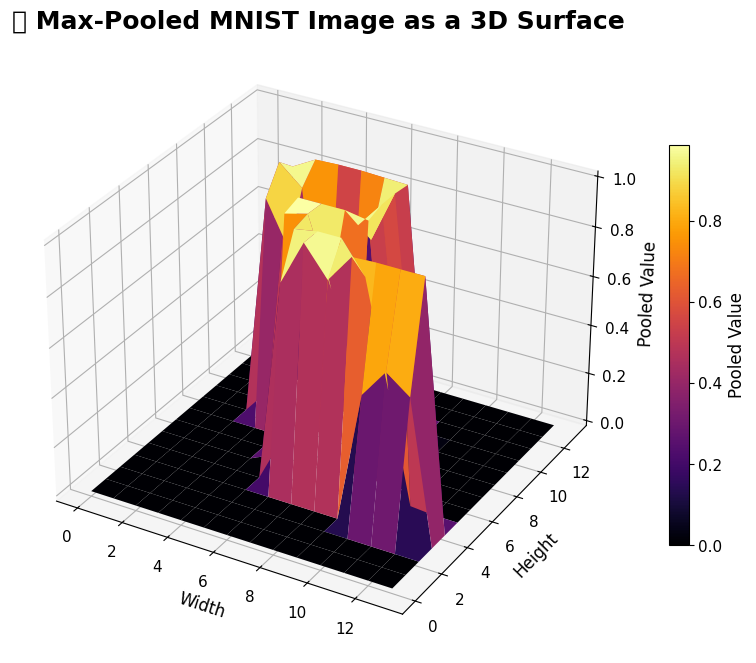

In [22]:
fig = plt.figure(figsize=(11, 8))
ax = fig.add_subplot(111, projection="3d")

x = np.arange(max_pooled.shape[1])
y = np.arange(max_pooled.shape[0])

X, Y = np.meshgrid(x, y)

surface = ax.plot_surface(
    X,
    Y,
    max_pooled,
    cmap="inferno",
    edgecolor="none",
    antialiased=True
)

ax.set_title("🏔️ Max-Pooled MNIST Image as a 3D Surface",
             fontsize=18,
             fontweight="bold")

ax.set_xlabel("Width")
ax.set_ylabel("Height")
ax.set_zlabel("Pooled Value")

fig.colorbar(surface, ax=ax, shrink=0.65, label="Pooled Value")

plt.show()

In [23]:
original_pixels = digit.size
pooled_pixels = max_pooled.size

reduction_percentage = (
    1 - pooled_pixels / original_pixels
) * 100

print("Original pixels :", original_pixels)
print("Pooled pixels   :", pooled_pixels)
print("Pixels removed  :", original_pixels - pooled_pixels)
print("Reduction       :", f"{reduction_percentage:.2f}%")

Original pixels : 784
Pooled pixels   : 196
Pixels removed  : 588
Reduction       : 75.00%


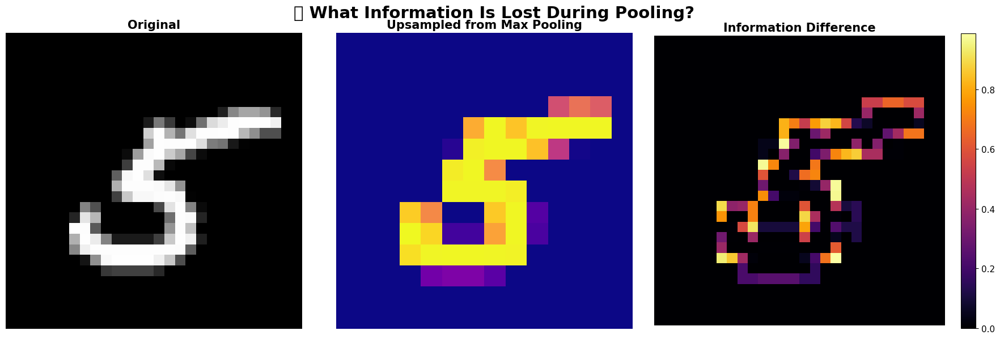

In [24]:
pooled_tensor = tf.convert_to_tensor(max_pooled, dtype=tf.float32)

upsampled = tf.image.resize(
    pooled_tensor[..., tf.newaxis],
    size=(28, 28),
    method="nearest"
).numpy().squeeze()

difference = np.abs(digit - upsampled)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(digit, cmap="gray")
axes[0].set_title("Original", fontweight="bold")

axes[1].imshow(upsampled, cmap="plasma")
axes[1].set_title("Upsampled from Max Pooling", fontweight="bold")

im = axes[2].imshow(difference, cmap="inferno")
axes[2].set_title("Information Difference", fontweight="bold")

for ax in axes:
    ax.axis("off")

plt.colorbar(im, ax=axes[2], fraction=0.046)

fig.suptitle("🧩 What Information Is Lost During Pooling?",
             fontsize=21,
             fontweight="bold")

plt.tight_layout()
plt.show()

In [25]:
input_tensor = tf.constant(digit[np.newaxis, ..., np.newaxis], dtype=tf.float32)

max_pool_layer = keras.layers.MaxPooling2D(
    pool_size=(2, 2),
    strides=(2, 2),
    padding="valid"
)

keras_max = max_pool_layer(input_tensor)

print("Input shape :", input_tensor.shape)
print("Output shape:", keras_max.shape)

Input shape : (1, 28, 28, 1)
Output shape: (1, 14, 14, 1)


In [26]:
keras_result = keras_max.numpy()[0, :, :, 0]

difference = np.max(
    np.abs(max_pooled - keras_result)
)

print("Maximum difference:", difference)

if difference < 1e-7:
    print("✅ Manual pooling and Keras pooling match perfectly!")
else:
    print("⚠️ Results are different.")

Maximum difference: 0.0
✅ Manual pooling and Keras pooling match perfectly!


In [27]:
avg_pool_layer = keras.layers.AveragePooling2D(
    pool_size=(2, 2),
    strides=(2, 2),
    padding="valid"
)

keras_avg = avg_pool_layer(input_tensor)

print("Input shape :", input_tensor.shape)
print("Output shape:", keras_avg.shape)

Input shape : (1, 28, 28, 1)
Output shape: (1, 14, 14, 1)


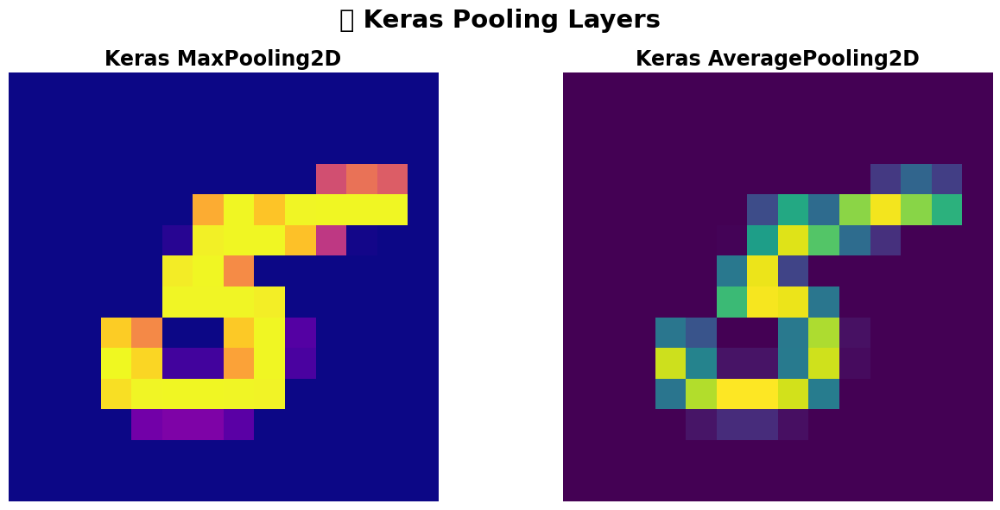

In [28]:
min_pool_layer = keras.layers.MinimumPooling2D if hasattr(
    keras.layers,
    "MinimumPooling2D"
) else None

fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(
    keras_max.numpy()[0, :, :, 0],
    cmap="plasma"
)

axes[0].set_title(
    "Keras MaxPooling2D",
    fontsize=17,
    fontweight="bold"
)

axes[1].imshow(
    keras_avg.numpy()[0, :, :, 0],
    cmap="viridis"
)

axes[1].set_title(
    "Keras AveragePooling2D",
    fontsize=17,
    fontweight="bold"
)

for ax in axes:
    ax.axis("off")

fig.suptitle(
    "🧠 Keras Pooling Layers",
    fontsize=21,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

In [29]:
conv_layer = keras.layers.Conv2D(
    filters=8,
    kernel_size=(3, 3),
    activation="relu",
    padding="same"
)

feature_maps = conv_layer(input_tensor)

print("Input shape       :", input_tensor.shape)
print("Feature map shape :", feature_maps.shape)

Input shape       : (1, 28, 28, 1)
Feature map shape : (1, 28, 28, 8)


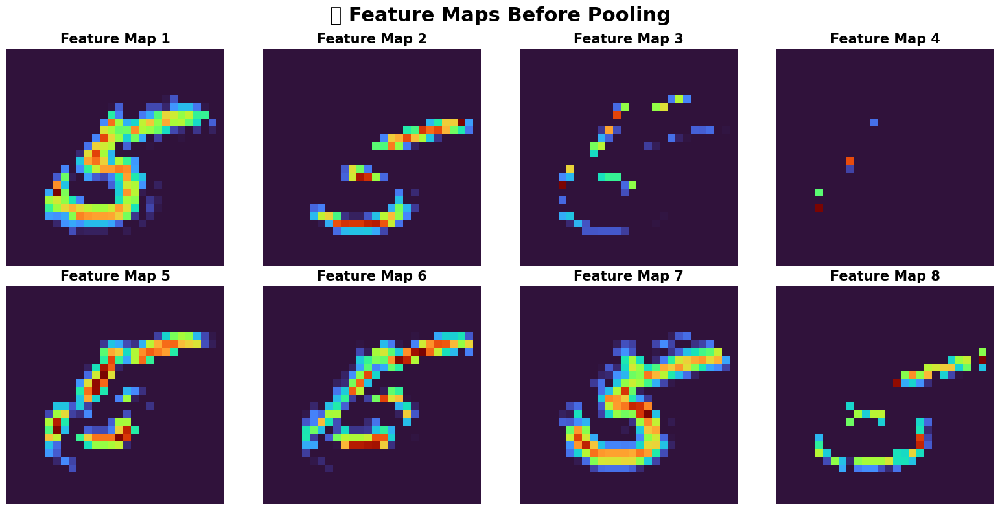

In [30]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i, ax in enumerate(axes.ravel()):
    ax.imshow(
        feature_maps.numpy()[0, :, :, i],
        cmap="turbo"
    )
    ax.set_title(
        f"Feature Map {i + 1}",
        fontweight="bold"
    )
    ax.axis("off")

fig.suptitle(
    "🎯 Feature Maps Before Pooling",
    fontsize=22,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

In [31]:
pool_layer = keras.layers.MaxPooling2D(
    pool_size=(2, 2),
    strides=(2, 2)
)

pooled_feature_maps = pool_layer(feature_maps)

print("Before pooling:", feature_maps.shape)
print("After pooling :", pooled_feature_maps.shape)

Before pooling: (1, 28, 28, 8)
After pooling : (1, 14, 14, 8)


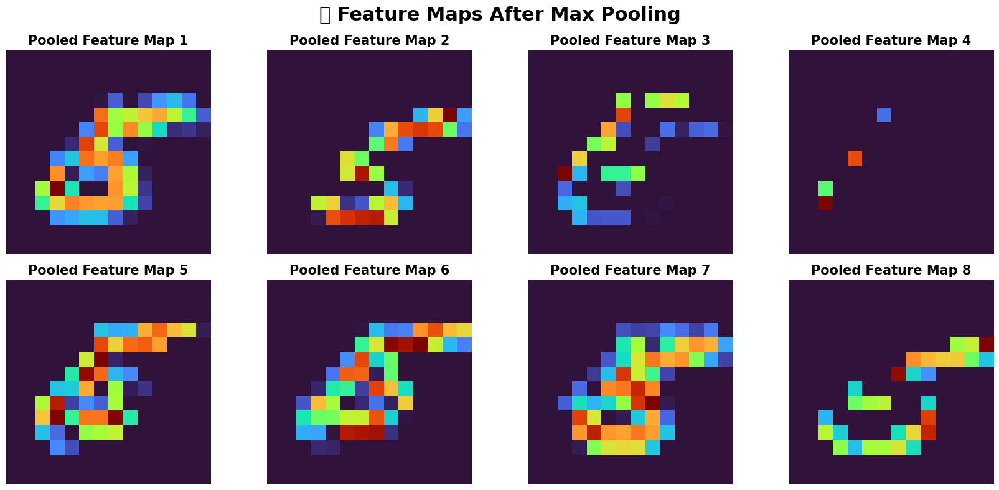

In [32]:
fig, axes = plt.subplots(2, 4, figsize=(17, 8))

for i, ax in enumerate(axes.ravel()):
    ax.imshow(
        pooled_feature_maps.numpy()[0, :, :, i],
        cmap="turbo"
    )
    ax.set_title(
        f"Pooled Feature Map {i + 1}",
        fontweight="bold"
    )
    ax.axis("off")

fig.suptitle(
    "🔥 Feature Maps After Max Pooling",
    fontsize=22,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

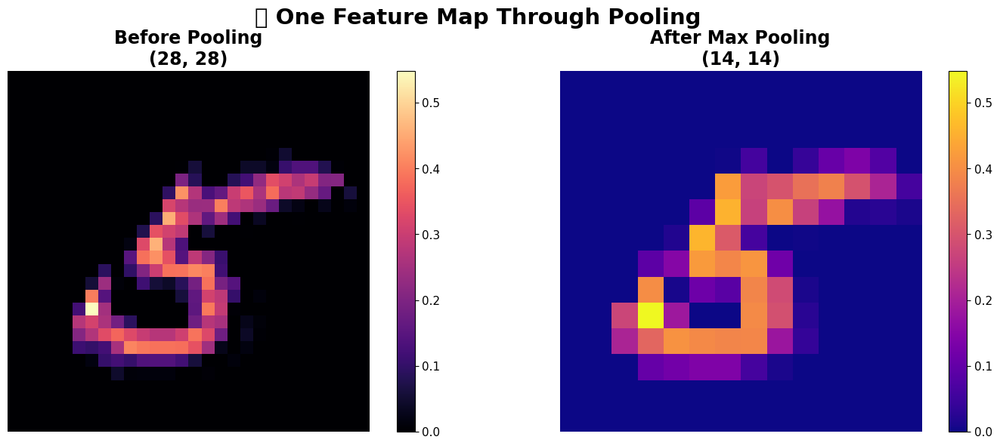

In [33]:
feature_id = 0

before = feature_maps.numpy()[0, :, :, feature_id]
after = pooled_feature_maps.numpy()[0, :, :, feature_id]

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

im1 = axes[0].imshow(before, cmap="magma")
axes[0].set_title(
    f"Before Pooling\n{before.shape}",
    fontsize=17,
    fontweight="bold"
)
axes[0].axis("off")
plt.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(after, cmap="plasma")
axes[1].set_title(
    f"After Max Pooling\n{after.shape}",
    fontsize=17,
    fontweight="bold"
)
axes[1].axis("off")
plt.colorbar(im2, ax=axes[1])

fig.suptitle(
    "📉 One Feature Map Through Pooling",
    fontsize=21,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

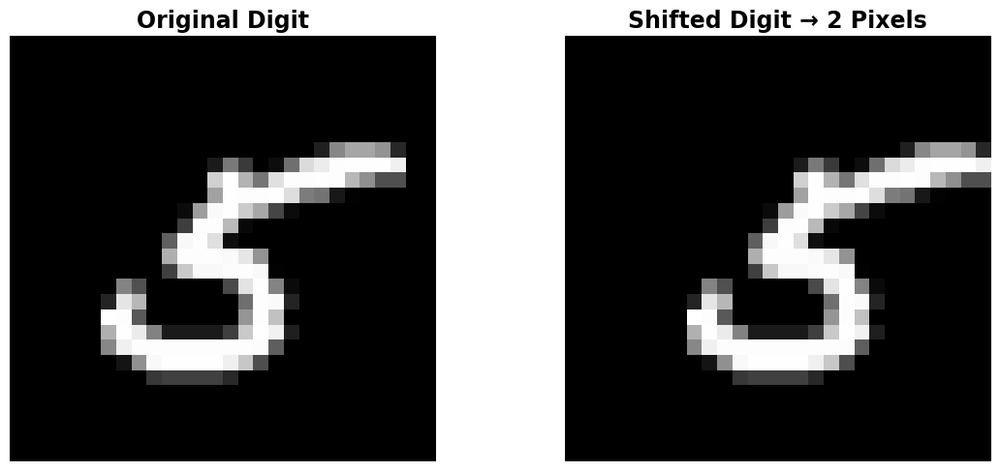

In [34]:
shifted_digit = np.roll(digit, shift=2, axis=1)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(digit, cmap="gray")
axes[0].set_title("Original Digit", fontsize=17, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(shifted_digit, cmap="gray")
axes[1].set_title("Shifted Digit → 2 Pixels", fontsize=17, fontweight="bold")
axes[1].axis("off")

plt.tight_layout()
plt.show()

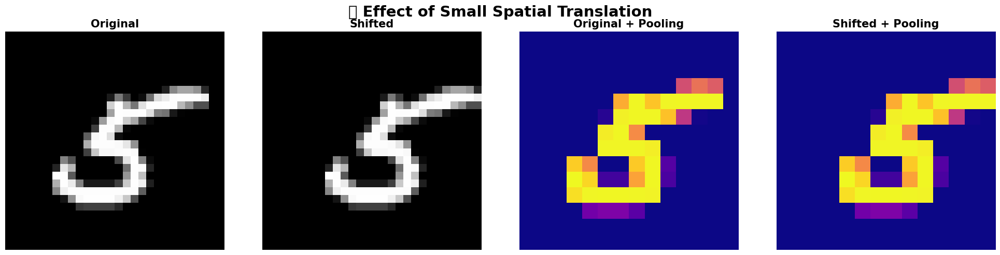

In [35]:
original_pool = max_pool_manual(
    digit,
    pool_size=2,
    stride=2
)

shifted_pool = max_pool_manual(
    shifted_digit,
    pool_size=2,
    stride=2
)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(digit, cmap="gray")
axes[0].set_title("Original", fontweight="bold")
axes[0].axis("off")

axes[1].imshow(shifted_digit, cmap="gray")
axes[1].set_title("Shifted", fontweight="bold")
axes[1].axis("off")

axes[2].imshow(original_pool, cmap="plasma")
axes[2].set_title("Original + Pooling", fontweight="bold")
axes[2].axis("off")

axes[3].imshow(shifted_pool, cmap="plasma")
axes[3].set_title("Shifted + Pooling", fontweight="bold")
axes[3].axis("off")

fig.suptitle(
    "🔄 Effect of Small Spatial Translation",
    fontsize=21,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

In [36]:
original_difference = np.mean(
    np.abs(digit - shifted_digit)
)

pooled_difference = np.mean(
    np.abs(original_pool - shifted_pool)
)

print("Average difference before pooling :", original_difference)
print("Average difference after pooling  :", pooled_difference)

print(
    "\nReduction in difference:",
    f"{(1 - pooled_difference / original_difference) * 100:.2f}%"
)

Average difference before pooling : 0.09347738
Average difference after pooling  : 0.09979992032963403

Reduction in difference: -6.76%


In [37]:
global_avg_pool = keras.layers.GlobalAveragePooling2D()

gap_output = global_avg_pool(feature_maps)

print("Feature maps shape:", feature_maps.shape)
print("GAP output shape  :", gap_output.shape)

Feature maps shape: (1, 28, 28, 8)
GAP output shape  : (1, 8)


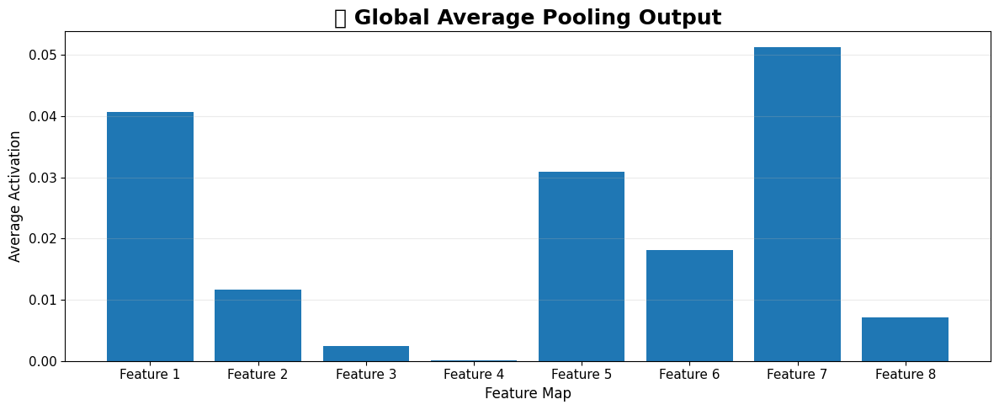

In [38]:
values = gap_output.numpy()[0]

plt.figure(figsize=(12, 5))

bars = plt.bar(
    np.arange(len(values)),
    values
)

plt.xticks(
    np.arange(len(values)),
    [f"Feature {i+1}" for i in range(len(values))]
)

plt.title(
    "🌍 Global Average Pooling Output",
    fontsize=18,
    fontweight="bold"
)

plt.xlabel("Feature Map")
plt.ylabel("Average Activation")

plt.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()

In [39]:
X_train_cnn = X_train_norm[..., np.newaxis]
X_test_cnn = X_test_norm[..., np.newaxis]

model = keras.Sequential([
    layers.Input(shape=(28, 28, 1)),

    layers.Conv2D(
        32,
        (3, 3),
        activation="relu",
        padding="same"
    ),

    layers.MaxPooling2D(
        pool_size=(2, 2)
    ),

    layers.Conv2D(
        64,
        (3, 3),
        activation="relu",
        padding="same"
    ),

    layers.MaxPooling2D(
        pool_size=(2, 2)
    ),

    layers.Flatten(),

    layers.Dense(
        128,
        activation="relu"
    ),

    layers.Dense(
        10,
        activation="softmax"
    )
])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 421,642 (1.61 MB)

 Trainable params: 421,642 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

In [40]:
sample = X_test_cnn[:1]

# Build symbolic functional DAG using explicit Input tensor
inputs = keras.Input(shape=(28, 28, 1))
x = inputs
intermediate_outputs = []

for layer in model.layers[:4]:
    x = layer(x)
    intermediate_outputs.append(x)

shape_model = keras.Model(inputs=inputs, outputs=intermediate_outputs)

# Run sub-model on sample data
outputs = shape_model(sample, training=False)

names = [
    "Conv2D #1",
    "MaxPool #1",
    "Conv2D #2",
    "MaxPool #2"
]

for name, output in zip(names, outputs):
    print(f"{name:15s} → {output.shape}")

Conv2D #1       → (1, 28, 28, 32)
MaxPool #1      → (1, 14, 14, 32)
Conv2D #2       → (1, 14, 14, 64)
MaxPool #2      → (1, 7, 7, 64)


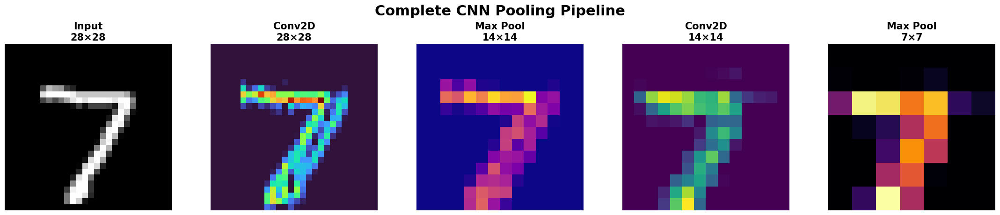

In [41]:
sample = X_test_cnn[:1]

conv1 = model.layers[0](sample)
pool1 = model.layers[1](conv1)
conv2 = model.layers[2](pool1)
pool2 = model.layers[3](conv2)

fig, axes = plt.subplots(1, 5, figsize=(22, 4.5), constrained_layout=True)

axes[0].imshow(sample[0, :, :, 0], cmap="gray")
axes[0].set_title("Input\n28×28", fontweight="bold")

axes[1].imshow(conv1[0, :, :, 0], cmap="turbo")
axes[1].set_title("Conv2D\n28×28", fontweight="bold")

axes[2].imshow(pool1[0, :, :, 0], cmap="plasma")
axes[2].set_title("Max Pool\n14×14", fontweight="bold")

axes[3].imshow(conv2[0, :, :, 0], cmap="viridis")
axes[3].set_title("Conv2D\n14×14", fontweight="bold")

axes[4].imshow(pool2[0, :, :, 0], cmap="inferno")
axes[4].set_title("Max Pool\n7×7", fontweight="bold")

for ax in axes:
    ax.axis("off")

fig.suptitle(
    "Complete CNN Pooling Pipeline",
    fontsize=22,
    fontweight="bold"
)

plt.show()

In [42]:
from ipywidgets import interact, IntSlider, Dropdown

def interactive_pooling(pool_size=2, stride=2, pooling_type="max"):
    if pooling_type == "max":
        result = max_pool_manual(
            digit,
            pool_size=pool_size,
            stride=stride
        )

        cmap = "plasma"

    elif pooling_type == "average":
        result = average_pool_manual(
            digit,
            pool_size=pool_size,
            stride=stride
        )

        cmap = "viridis"

    elif pooling_type == "min":
        result = min_pool_manual(
            digit,
            pool_size=pool_size,
            stride=stride
        )

        cmap = "cividis"

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    axes[0].imshow(digit, cmap="magma")
    axes[0].set_title(
        f"Original\n{digit.shape}",
        fontsize=17,
        fontweight="bold"
    )
    axes[0].axis("off")

    im = axes[1].imshow(result, cmap=cmap)
    axes[1].set_title(
        f"{pooling_type.title()} Pooling\n{result.shape}",
        fontsize=17,
        fontweight="bold"
    )
    axes[1].axis("off")

    plt.colorbar(im, ax=axes[1])

    fig.suptitle(
        f"Pooling = {pool_size}×{pool_size} | Stride = {stride}",
        fontsize=19,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()


interact(
    interactive_pooling,
    pool_size=IntSlider(
        min=2,
        max=5,
        step=1,
        value=2
    ),
    stride=IntSlider(
        min=1,
        max=5,
        step=1,
        value=2
    ),
    pooling_type=Dropdown(
        options=["max", "average", "min"],
        value="max",
        description="Pooling:"
    )
)

interactive(children=(IntSlider(value=2, description='pool_size', max=5, min=2), IntSlider(value=2, descriptio…

<function __main__.interactive_pooling(pool_size=2, stride=2, pooling_type='max')>